# Introduction to Diffusers

## Setup

In [1]:
!pip install -q -U diffusers
!pip install -q transformers

## Setting Seed

In [1]:
seed = 42

## Text-to-Image with Stable Diffusion Pipeline

### Stable Diffusion 1.5

In [2]:
import torch

from diffusers import StableDiffusionPipeline

In [3]:
# Set computation device.
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [4]:
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    use_safetensors=True,
    torch_dtype=torch.float16,
).to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

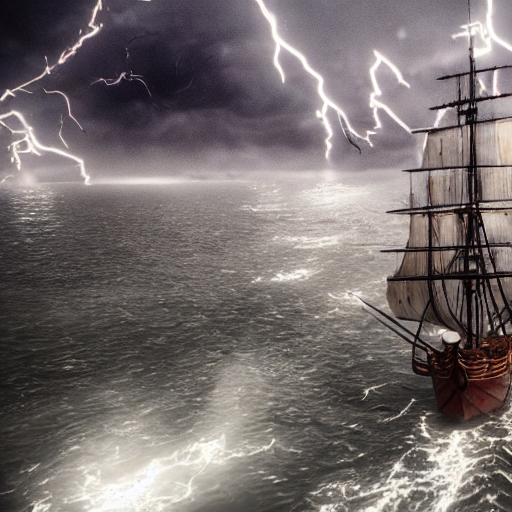

In [5]:
# Prompting to generate image.
prompt = "A photo of a large pirate ship sailing in the middle of a storm and lightning, highly detailed, unreal engine effect"
image = pipe(
    prompt, num_inference_steps=150, generator=torch.manual_seed(seed)
).images[0]

image

### Stable Diffusion 2.1

In [6]:
pipe = StableDiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-1",
    torch_dtype=torch.float16,
    variant="fp16"
)

pipe = pipe.to(device)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

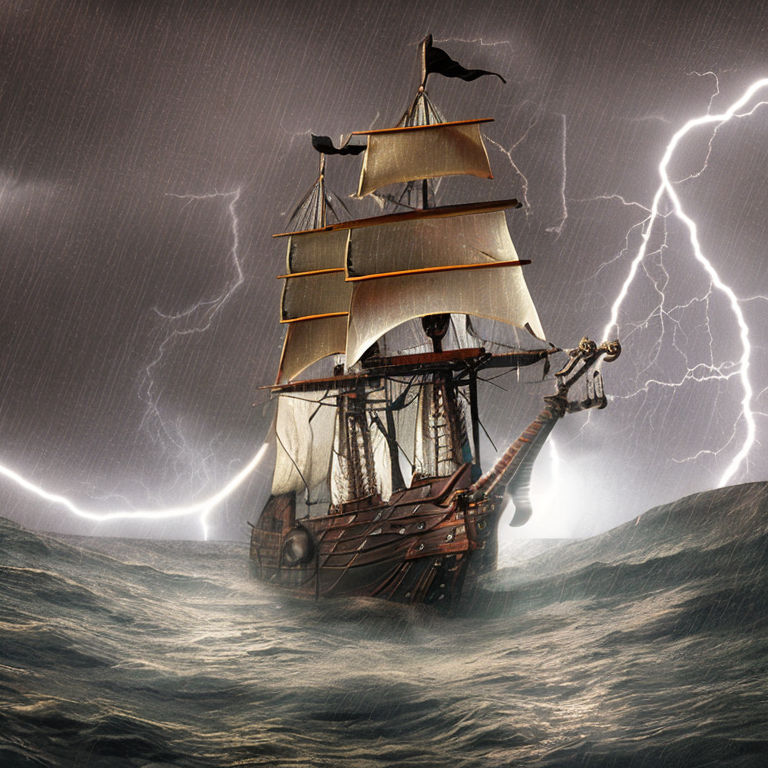

In [7]:
# prompt = "A mangrove forest during sunset, water color painting on canvas"
prompt = "A photo of a large pirate ship sailing in the middle of a storm and lightning, highly detailed, unreal engine effect"
image = pipe(
    prompt, num_inference_steps=150, generator=torch.manual_seed(seed)
).images[0]
image

#### Negative Prompt

  0%|          | 0/150 [00:00<?, ?it/s]

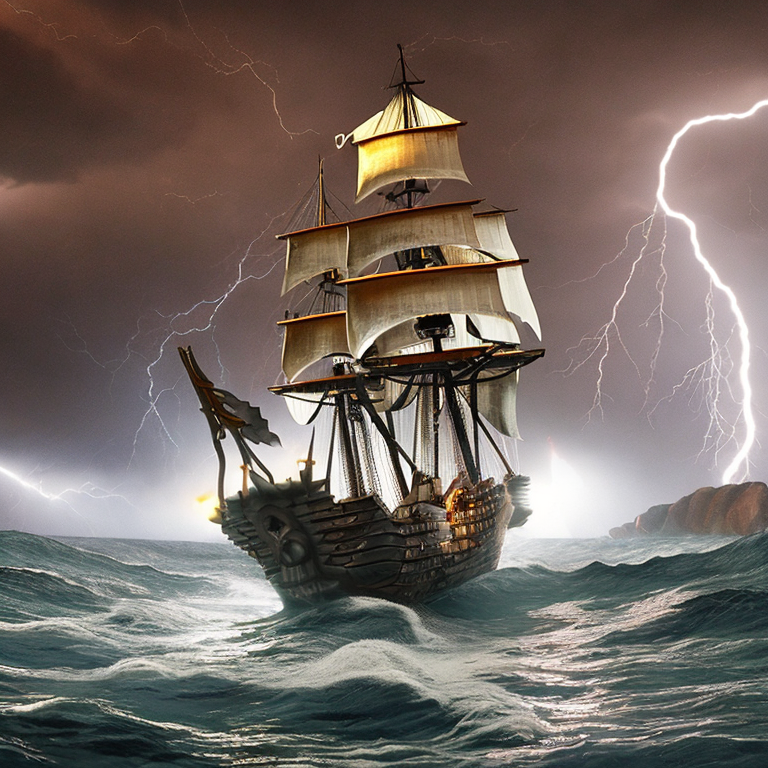

In [8]:
prompt = "A photo of a large pirate ship sailing in the middle of a storm and lightning, highly detailed, unreal engine effect"
image = pipe(
    prompt, 
    num_inference_steps=150, 
    generator=torch.manual_seed(seed),
    negative_prompt='low resolution, distorted, ugly, deformed, disfigured, poor details'
).images[0]
image

#### Swapping Schedulers

In [9]:
from diffusers import EulerAncestralDiscreteScheduler

In [10]:
pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)

  0%|          | 0/150 [00:00<?, ?it/s]

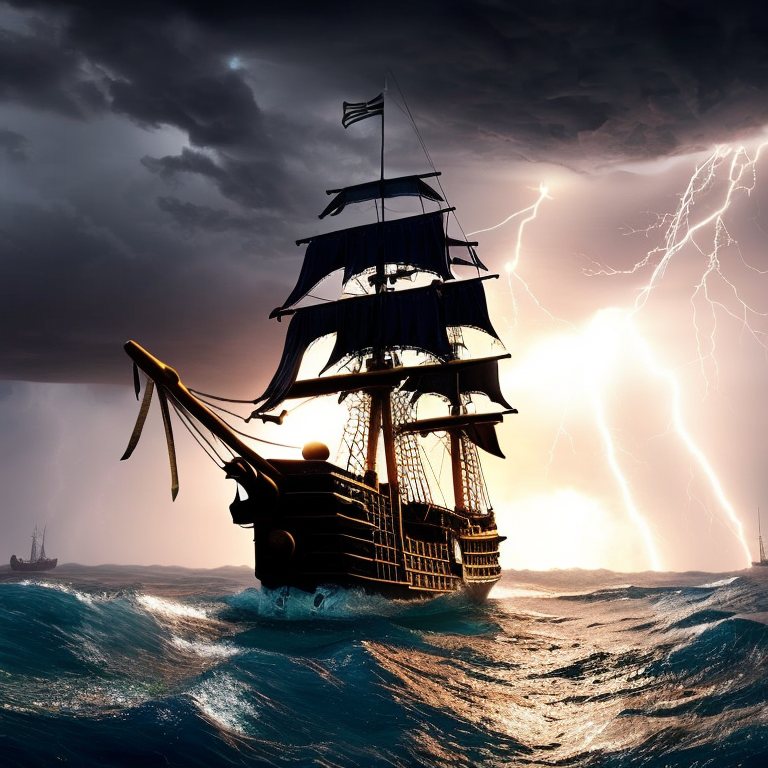

In [13]:
image = pipe(
    prompt, 
    num_inference_steps=150, 
    generator=torch.manual_seed(seed),
    negative_prompt='low resolution, distorted, ugly, deformed, disfigured, poor details'
).images[0]

image

## Stable Diffusion Image-to-Image Pipeline

In [15]:
import requests
import torch
from PIL import Image
from io import BytesIO

from diffusers import StableDiffusionImg2ImgPipeline

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

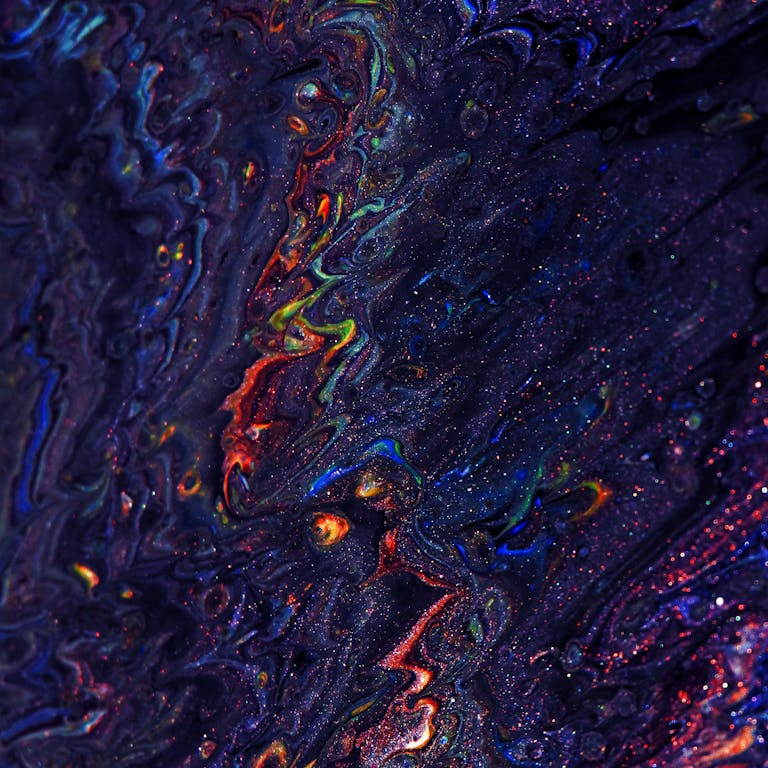

In [17]:
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    'stabilityai/stable-diffusion-2-1',
    torch_dtype=torch.float16
).to(device)

image_path = 'images/abstract_art_1.jpg'

init_image = Image.open(image_path).convert("RGB")
init_image = init_image.resize((768, 768))

init_image

  0%|          | 0/150 [00:00<?, ?it/s]

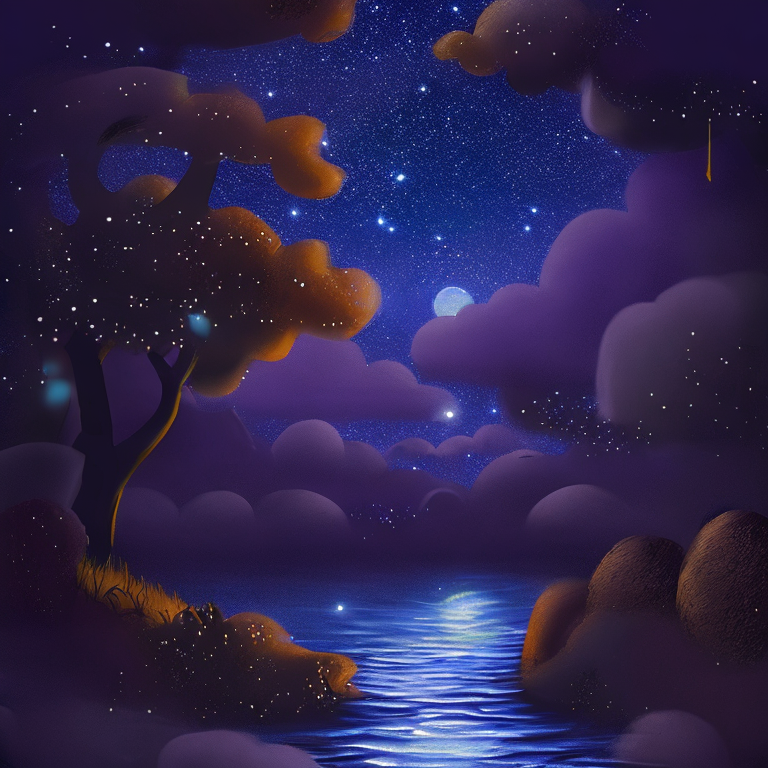

In [18]:
prompt = "A fantasy landscape, with starry night sky, moonlit river, trending on artstation"

image = pipe(
    prompt=prompt,
    image=init_image,
    num_inference_steps=150,
    strength=1,
    generator=torch.manual_seed(seed)
).images[0]

image

## Diffusers AutoPipeline

In [20]:
from diffusers import AutoPipelineForText2Image

In [21]:
pipe = AutoPipelineForText2Image.from_pretrained(
    'stabilityai/stable-diffusion-2-1',
    torch_dtype=torch.float16,
    use_safetensors=True
).to(device)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

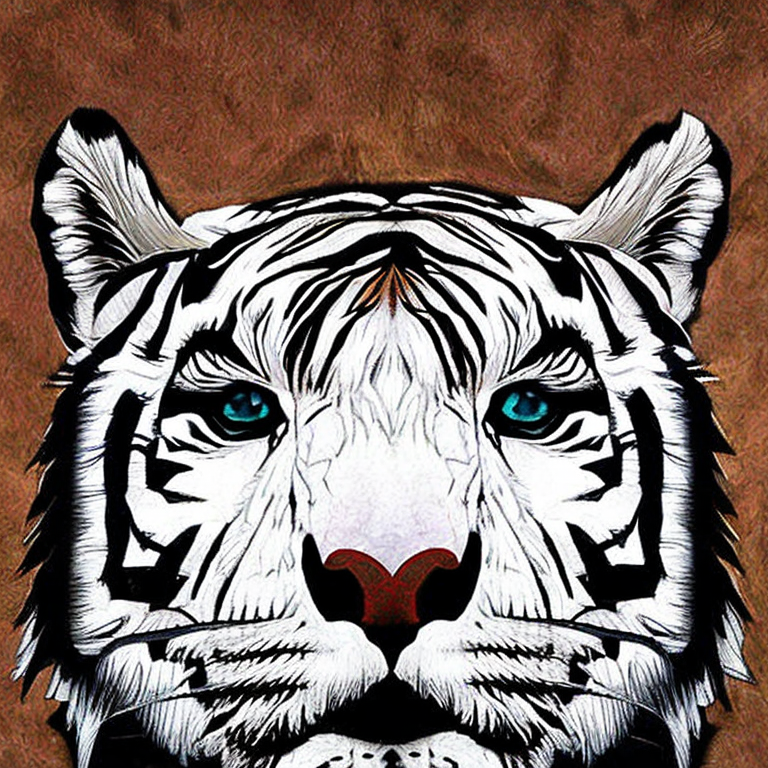

In [24]:
prompt = "A white tiger, anime style, realism, detailed line art, fine details, solid lines"

image = pipe(
    prompt, 
    num_inference_steps=150, 
    generator=torch.manual_seed(seed)
).images[0]

image

## AutoPipeline for Image-to-Image

In [25]:
from diffusers import AutoPipelineForImage2Image

In [26]:
pipe = AutoPipelineForImage2Image.from_pretrained(
    'stabilityai/stable-diffusion-2-1',
    torch_dtype=torch.float16,
    use_safetensors=True,
).to(device)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

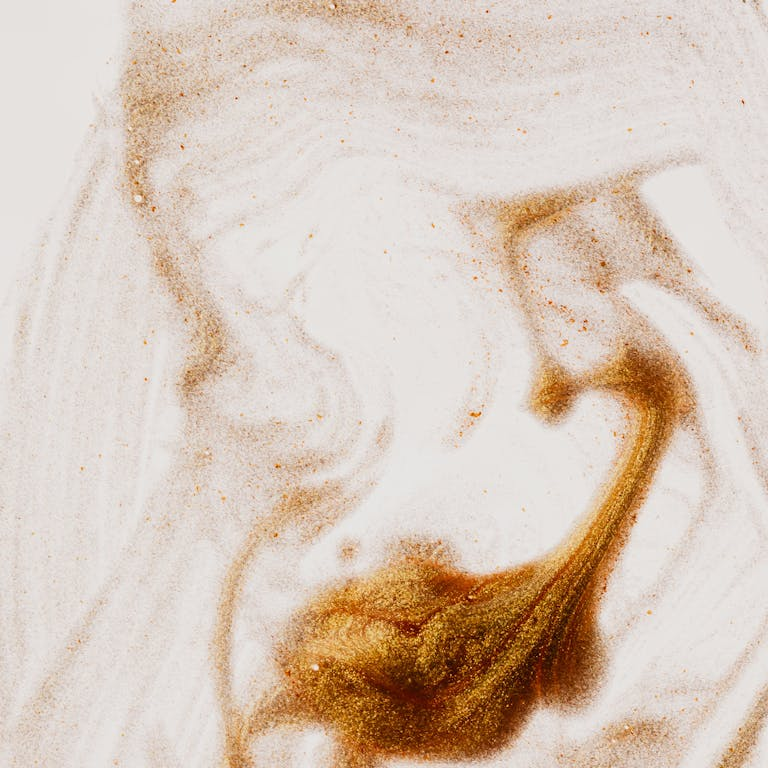

In [33]:
image_path = 'images/abstract_art_2.jpg'

init_image = Image.open(image_path).convert("RGB")
init_image

  0%|          | 0/150 [00:00<?, ?it/s]

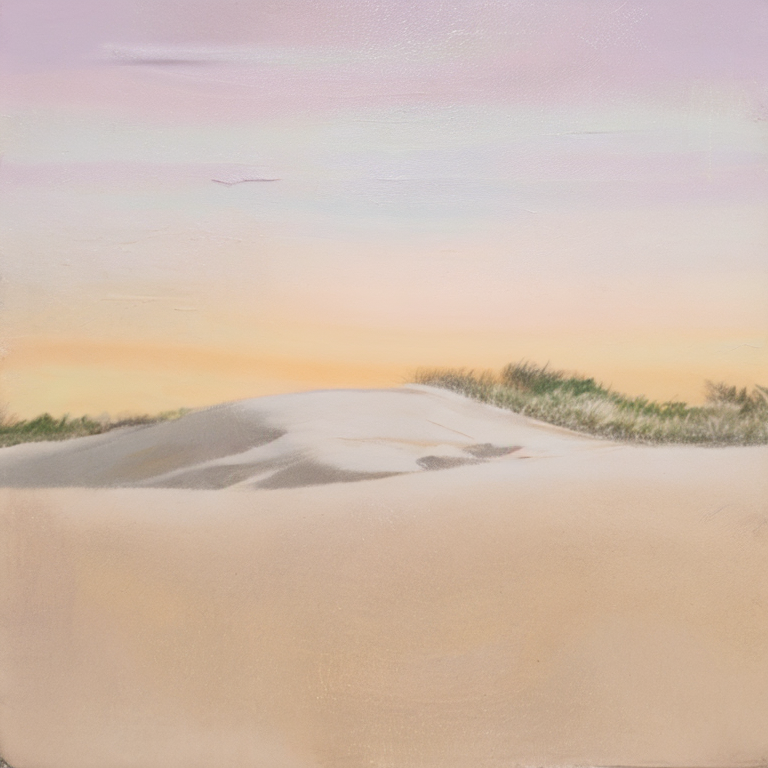

In [34]:
prompt = "a painting of sand dunes in a desert, with sun rising on the horizon, sand particle style, pastel drawing, on canvas"

image = pipe(
    prompt,
    init_image,
    num_inference_steps=150,
    strength=1.0,
    generator=torch.manual_seed(seed)
).images[0]

image

## AutoPipeline for Image InPainting

In [3]:
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image

In [4]:
pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    use_safetensors=True
).to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [5]:
img_url = "https://www.dropbox.com/scl/fi/oymummr3q4i86fbx79qv4/car.jpg?rlkey=8aogj5fwb0lrzd5u36rb3ifih&dl=1"
mask_url = "https://www.dropbox.com/scl/fi/le25tqopqapligom78myp/car_mask.png?rlkey=8t556dfxi1mr543j5fdwcg5mc&dl=1"

init_image = load_image(img_url).convert("RGB")
mask_image = load_image(mask_url).convert("RGB")

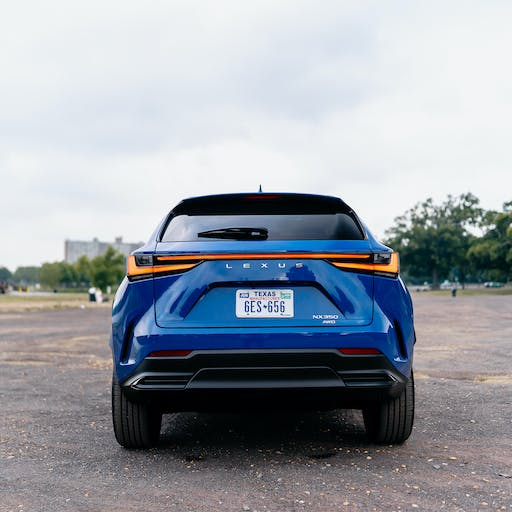

In [6]:
init_image

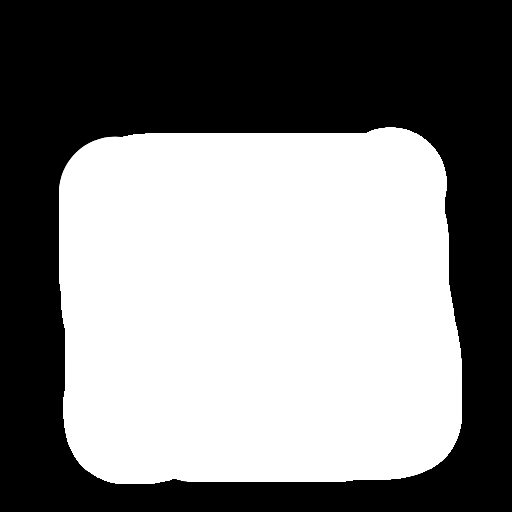

In [7]:
mask_image

  0%|          | 0/150 [00:00<?, ?it/s]

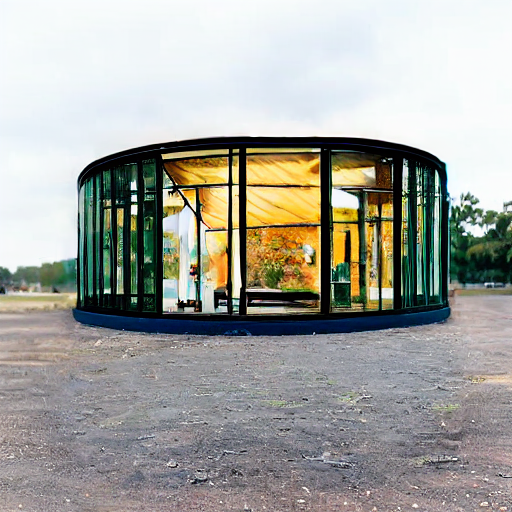

In [10]:
prompt = "A glass house in the middle of a ground"
image = pipeline(
    prompt,
    image=init_image,
    mask_image=mask_image,
    num_inference_steps=150,
    generator=torch.manual_seed(seed)
).images[0]

image

## Dynamic Masking for Inpainting

In [11]:
!pip install -q gradio==3.50.2

In [28]:
import gradio as gr
import numpy as np
from PIL import Image

def process_and_save_image(uploaded_image):
    # Save the final mask image to disk
    final_mask = Image.fromarray(uploaded_image['mask'])
    final_image = Image.fromarray(uploaded_image['image'])
    
    save_path_mask = './final_mask_image.png'
    save_path_image = './final_image.png'
    
    final_mask.save(save_path_mask)
    final_image.save(save_path_image)

    # Return the original and the final mask image
    return final_image, final_mask

# Create the Gradio interface
iface = gr.Interface(
    fn=process_and_save_image,
    inputs=[
        gr.Image(
            tool="sketch",
            image_mode='RGBA',
            shape=(512, 512),
            brush_color="#ffffff",
            mask_opacity=1.0
        ),
    ],
    outputs=[
        gr.outputs.Image(label="Original Image", type='pil'),
        gr.outputs.Image(label="Final Mask Image", type='pil')
    ]
)

# Launch the interface
iface.launch(share=True)

/tmp/ipykernel_104761/2323731631.py:32: GradioDeprecationWarning: Usage of gradio.outputs is deprecated, and will not be supported in the future, please import your components from gradio.components
  gr.outputs.Image(label="Original Image", type='pil'),
/tmp/ipykernel_104761/2323731631.py:33: GradioDeprecationWarning: Usage of gradio.outputs is deprecated, and will not be supported in the future, please import your components from gradio.components
  gr.outputs.Image(label="Final Mask Image", type='pil')


Running on local URL:  http://127.0.0.1:7861
Running on public URL: https://a2e5da9733891458dc.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


In [29]:
init_image = load_image('final_image.png').convert("RGB")
mask_image = load_image('final_mask_image.png').convert("RGB")

  0%|          | 0/150 [00:00<?, ?it/s]

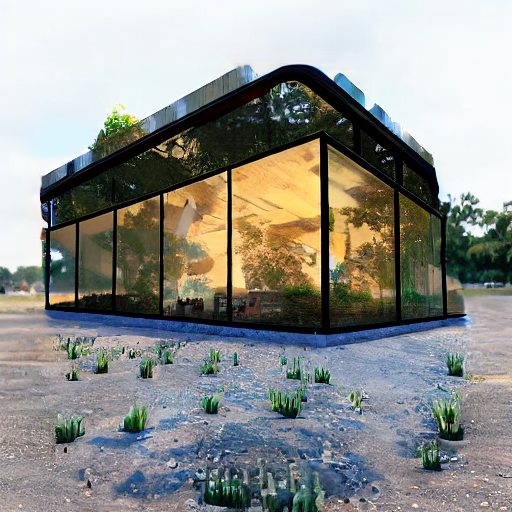

In [30]:
prompt = "A glass house in the middle of the ground, highly detailed, 4k, trending on artstation"
image = pipeline(
    prompt,
    image=init_image,
    mask_image=mask_image,
    num_inference_steps=150,
    generator=torch.manual_seed(seed)
).images[0]

image